***
# I.  BUSINESS UNDERSTANDING
***

<div style="display: flex;">
    <div style="flex: 1;">
        <!-- Table of Contents -->
        <div style="background-color: #f9f9f9; color:#333; border: 1px solid #ddd; border-radius: 5px; padding: 30px; margin-right: 50px; max-width: 300px;">
            <strong style="font-size: 30px;">Table of Contents</strong>
            <!-- Include your table of contents here -->
            <ul>
                <li><a href="#business-understanding">BUSINESS UNDERSTANDING</a></li>
            </ul>
            <ul>
                <li><a href="#data-understanding">DATA UNDERSTANDING</a></li>
                <ul>
                    <li><a href="#data-surface-properties-content-quality">Understanding Data Surface Properties and Content Quality</a></li>
                    <li><a href="#data-cleaning">Data Cleaning</a></li>
                    <li><a href="#bivariable-multivariate-analysis">Bivariable & Multivariate Analysis</a></li>
                        <ul>
                            <li><a href="#correlation-analysis">Correlation Analysis</a></li>
                            <li><a href="#interaction-effects">Interaction Effects</a></li>
                            <li><a href="#cluster-analysis">Cluster Analysis</a></li>
                        </ul>
                    <li><a href="#hypothesis-testing">Hypothesis Testing</a></li>
                    <li><a href="#answering-analytical-questions">Answering Analytical Questions</a></li>
                </ul>
            </ul>
            <ul>
                <li><a href="#data-preparation">DATA PREPARATION</a></li>
            </ul>
        </div>
    </div>
    <div style="flex: 3;">
        <!-- Contract Information Card -->
        <div style="background-color: #f9f9f9; color:#333; border: 1px solid #ddd; border-radius: 5px; padding: 30px; max-width: 700px; margin: 0 auto;">
            <strong style="font-size: 30px;">Contract Information</strong>
            <!-- Include your contract information here -->
            <p><strong>Project Name:</strong> Sepsis Detective</p>
            <p><strong>Project Title:</strong> Sepsis Prediction for Early Detection and Intervention Using Machine Learning and APIs</p>
            <p><strong>Project Description:</strong> This project is focused on building a classification model to predict whether or not a patient in ICU will develop sepsis using machine learning techniques. The project also includes developing an API for seamless interaction with the model, aiding in early detection and intervention for sepsis.</p>
            <p><strong>Project Duration:</strong> 4 weeks</p>
            <p><strong>Data Source:</strong></p>
            <address>
                The Johns Hopkins University<br>
                Johns Hopkins Road<br>
                Laurel, MD 20707<br>
                (301) 953-6231
            </address>
            <p><strong>Parties Involved:</strong></p>
            <ul>
                <li>The Johns Hopkins University - Client</li>
                <li>Solomnon Yeboah (Data Scientist) - Service Provider</li>
            </ul>
            <p><strong>Deliverables:</strong></p>
            <ul>
                <li>An ML API for Predicting Sepsis with High Accuracy (at least 98%)</li>
                <li>Development notebook</li>
            </ul>
            <p><strong>Confidentiality Agreement:</strong> I, Solomon Yeboah, agree not to share any project-related data with any third party without prior consent.</p>
            <div style="display: flex; justify-content: space-between;">
                <div style="text-align: left;">
                    <p><strong>Signature of Data Scientist:</strong></p>
                    <img src="../reports/img/sy-signature.jpg" alt="Your Signature">
                </div>
                <div style="text-align: right;">
                    <p><strong>Signature of Client:</strong></p>
                    <img src="../reports/img/1200px-Johns_Hopkins_signature.svg.png" alt="Client's Signature">
                </div>
            </div>
        </div>
    </div>

</div>


## Hypothesis

H0: There is NO RELATIONSHIP between patient health indicators and the likelihood of developing sepsis.

H1: There is A RELATIONSHIP between patient health indicators and the likelihood of developing sepsis.
 
(Broad hypothesis is to be refined after Initial exploration)

## Analytical Questions

1. How many patients have valid insurance cards, and what percentage of patients does this represent?
2. What are the average plasma glucose (PRG) and blood pressure (PR) levels among patients?
3. Is there a correlation between body mass index (M11) and blood work results (PL, SK, TS, BD2)?

- What is the percentage of patients who develop sepsis (Sepssis) in the dataset?
- Are there any patterns or trends in health indicators or demographics among patients who develop sepsis?

- Is there any trend or pattern in sepsis cases over time based on patient IDs (ID)?
- Are there changes or fluctuations in health indicators or demographics over different age groups?

- Which features (PRG, PL, PR, SK, TS, M11, BD2, Age, Insurance) are most predictive of sepsis development?

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from seaborn_qqplot import pplot


from ydata_profiling import ProfileReport
import copy

from sklearn.feature_selection import mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.cluster import KMeans

from scipy.stats import shapiro, levene, norm, boxcox, mannwhitneyu

import statsmodels.api as sm

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

#

***
# II. DATA UNDERSTANDING 
***

## 1A. Understanding data surface properties

In [35]:
train_df = pd.read_csv("../data/raw/Paitients_Files_Train.csv")
test_df = pd.read_csv("../data/raw/Paitients_Files_Test.csv")
train_df

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive
...,...,...,...,...,...,...,...,...,...,...,...
594,ICU200604,6,123,72,45,230,33.6,0.733,34,0,Negative
595,ICU200605,0,188,82,14,185,32.0,0.682,22,1,Positive
596,ICU200606,0,67,76,0,0,45.3,0.194,46,1,Negative
597,ICU200607,1,89,24,19,25,27.8,0.559,21,0,Negative


In [3]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 599 entries, 0 to 598
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         599 non-null    object 
 1   PRG        599 non-null    int64  
 2   PL         599 non-null    int64  
 3   PR         599 non-null    int64  
 4   SK         599 non-null    int64  
 5   TS         599 non-null    int64  
 6   M11        599 non-null    float64
 7   BD2        599 non-null    float64
 8   Age        599 non-null    int64  
 9   Insurance  599 non-null    int64  
 10  Sepssis    599 non-null    object 
dtypes: float64(2), int64(7), object(2)
memory usage: 51.6+ KB


In [4]:
test_df

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,ICU200609,1,109,38,18,120,23.1,0.407,26,1
1,ICU200610,1,108,88,19,0,27.1,0.400,24,1
2,ICU200611,6,96,0,0,0,23.7,0.190,28,1
3,ICU200612,1,124,74,36,0,27.8,0.100,30,1
4,ICU200613,7,150,78,29,126,35.2,0.692,54,0
...,...,...,...,...,...,...,...,...,...,...
164,ICU200773,10,101,76,48,180,32.9,0.171,63,1
165,ICU200774,2,122,70,27,0,36.8,0.340,27,1
166,ICU200775,5,121,72,23,112,26.2,0.245,30,1
167,ICU200776,1,126,60,0,0,30.1,0.349,47,1


In [5]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169 entries, 0 to 168
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         169 non-null    object 
 1   PRG        169 non-null    int64  
 2   PL         169 non-null    int64  
 3   PR         169 non-null    int64  
 4   SK         169 non-null    int64  
 5   TS         169 non-null    int64  
 6   M11        169 non-null    float64
 7   BD2        169 non-null    float64
 8   Age        169 non-null    int64  
 9   Insurance  169 non-null    int64  
dtypes: float64(2), int64(7), object(1)
memory usage: 13.3+ KB


## 1B. Understanding data content and quality

In [6]:
profile = ProfileReport(train_df, dark_mode=True, title="Profile of Sepsis Data")

**Surface Property Summary**

**Dataset Source:** The John Hopkins Universtiy

**Abstract:**  The dataset contains comprehensive information about the health status of patients in the ICU, including details on Patients information and clinical measurements. 

**Features:** 
- PRG -- Plasma glucose
- PL  -- Blood Work Result-1 (mu U/ml)
- PR  -- Blood Pressure (mm Hg)
- SK  -- Blood Work Result-2 (mm)
- TS  -- Blood Work Result-3 (mu U/ml)
- M11 -- Body mass index (weight in kg)/(height in m)^2
- BD2 -- Blood Work Result-4 (mu U/ml)
- Age -- patients age (years)
- Insurance	--	If a patient holds a valid insurance card

**Target:**
- Sepsis --	Positive: if a patient in ICU will develop a sepsis , and Negative: otherwise

**Data Type:**  Multivariate

**Format Type:**  Matrix


Dataset seems to be clean, with all variables assigned their right data types. 

In [7]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
# save profile report

profile.to_file("../reports/sepsis_profile.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
num_cols = ['PRG', 'PL', 'PR', 'SK', 'TS', 'M11', 'BD2', 'Age']

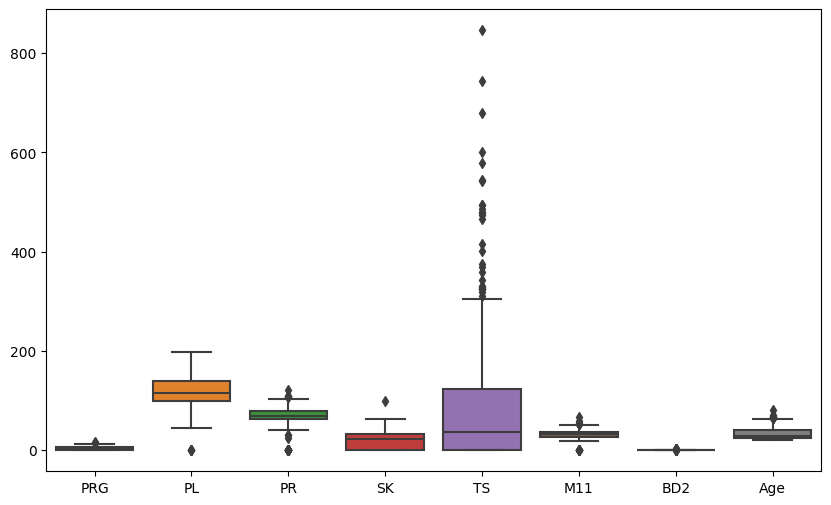

In [10]:
## check outliers 
fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.boxplot(train_df[num_cols])

In [11]:
def plot_binary_outliers(dataset, col, outlier_col, reset_index):
    """Plot outliers in case of a binary outlier score. Here, the col specifies the real data
    column and outlier_col the columns with a binary value (outlier or not).

    Args:
        dataset (pd.DataFrame): The dataset
        col (string): Column that you want to plot
        outlier_col (string): Outlier column marked with true/false
        reset_index (bool): whether to reset the index for plotting
    """

    # Taken from: https://github.com/mhoogen/ML4QS/blob/master/Python3Code/util/VisualizeDataset.py

    dataset = dataset.dropna(axis=0, subset=[col, outlier_col])
    dataset[outlier_col] = dataset[outlier_col].astype("bool")

    if reset_index:
        dataset = dataset.reset_index()

    fig, ax = plt.subplots()

    plt.xlabel("samples")
    plt.ylabel("value")

    # Plot non outliers in default color
    ax.plot(
        dataset.index[~dataset[outlier_col]],
        dataset[col][~dataset[outlier_col]],
        "+",
    )
    # Plot data points that are outliers in red
    ax.plot(
        dataset.index[dataset[outlier_col]],
        dataset[col][dataset[outlier_col]],
        "r+",
    )

    plt.legend(
        ["outlier " + col, "no outlier " + col],
        loc="upper center",
        ncol=2,
        fancybox=True,
        shadow=True,
    )
    plt.show()


In [12]:
def mark_outliers_iqr(dataset, col):
    """Function to mark values as outliers using the IQR method.

    Args:
        dataset (pd.DataFrame): The dataset
        col (string): The column you want apply outlier detection to

    Returns:
        pd.DataFrame: The original dataframe with an extra boolean column
        indicating whether the value is an outlier or not.
    """

    dataset = dataset.copy()

    Q1 = dataset[col].quantile(0.25)
    Q3 = dataset[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    dataset[col + "_outlier"] = (dataset[col] < lower_bound) | (
        dataset[col] > upper_bound
    )

    return dataset


In [13]:
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["figure.dpi"] = 100

In [14]:
col = "PRG"
data = mark_outliers_iqr(dataset=train_df, col=col)
data.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,PRG_outlier
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive,False
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative,False
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive,False
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative,False
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive,False


Using the Interquartile range, there's quite a number of outliers present.  Let's visualize the data to see where the outliers occur

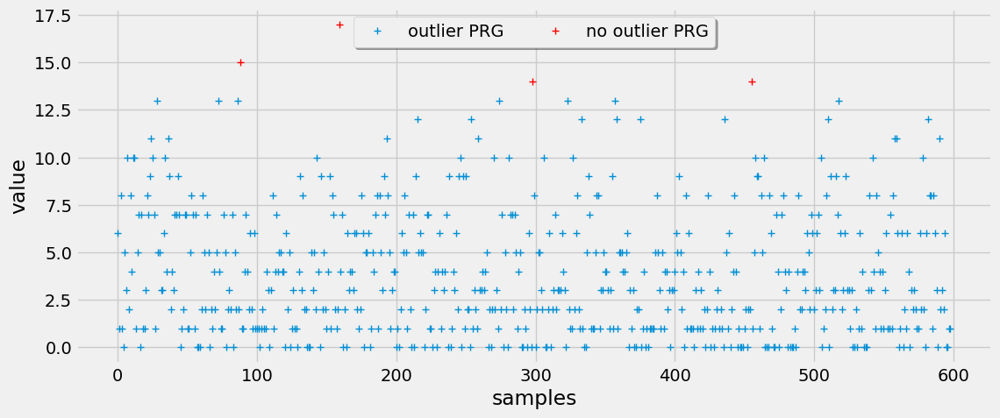

In [15]:
plot_binary_outliers(dataset=data, col=col, outlier_col=col + "_outlier", reset_index=True)

We repeat this for the rest of the columns
 

5 outliers in column PL


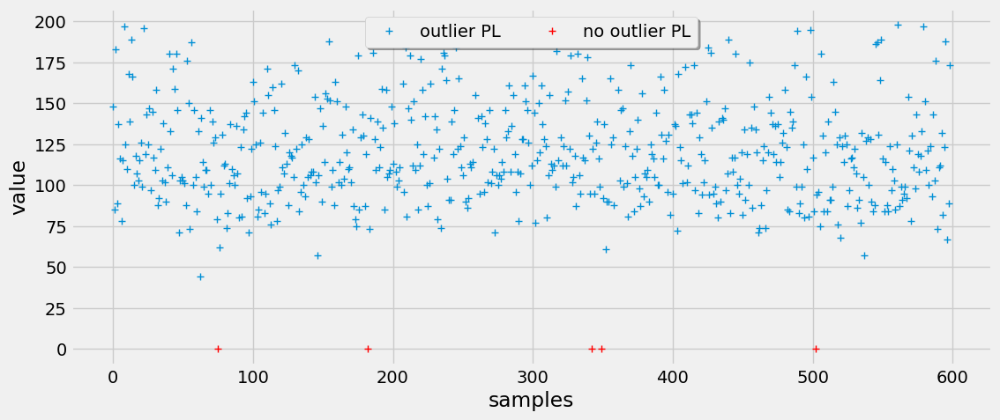

37 outliers in column PR


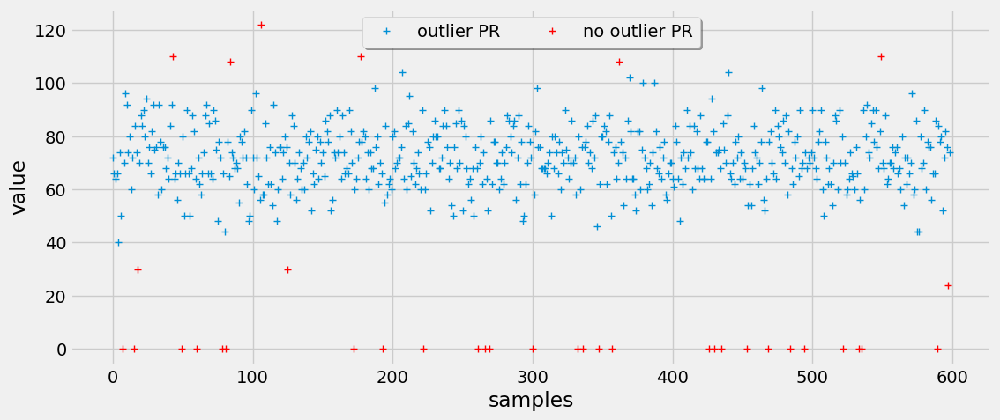

1 outliers in column SK


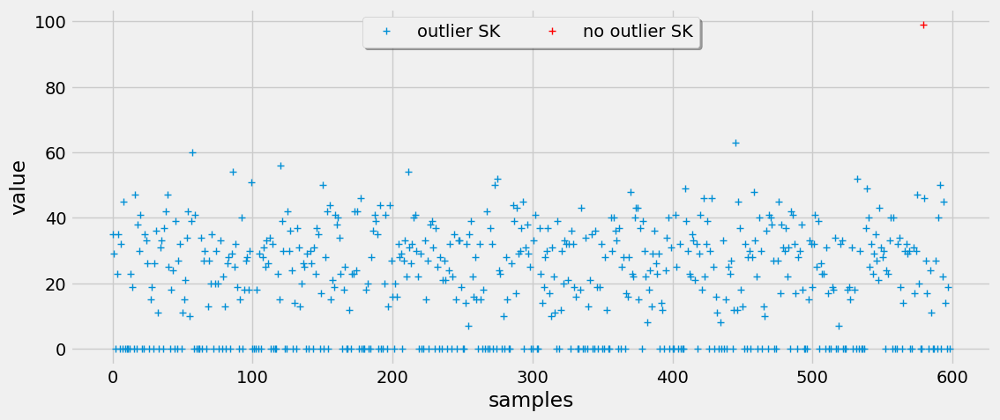

28 outliers in column TS


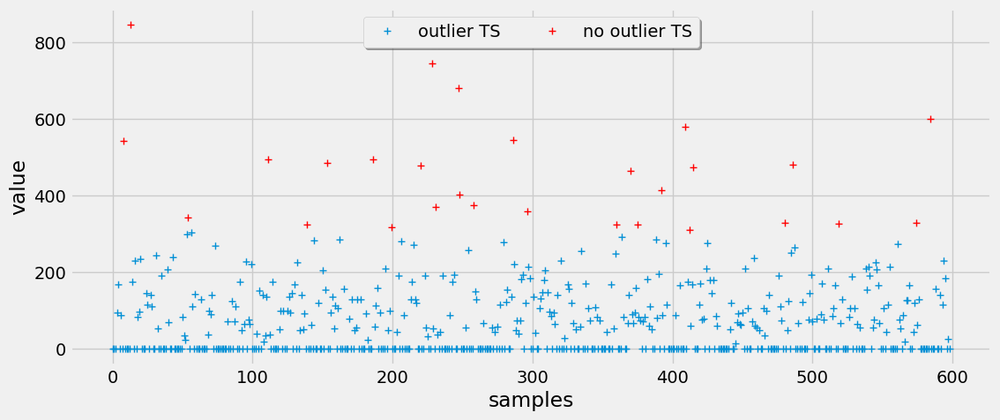

16 outliers in column M11


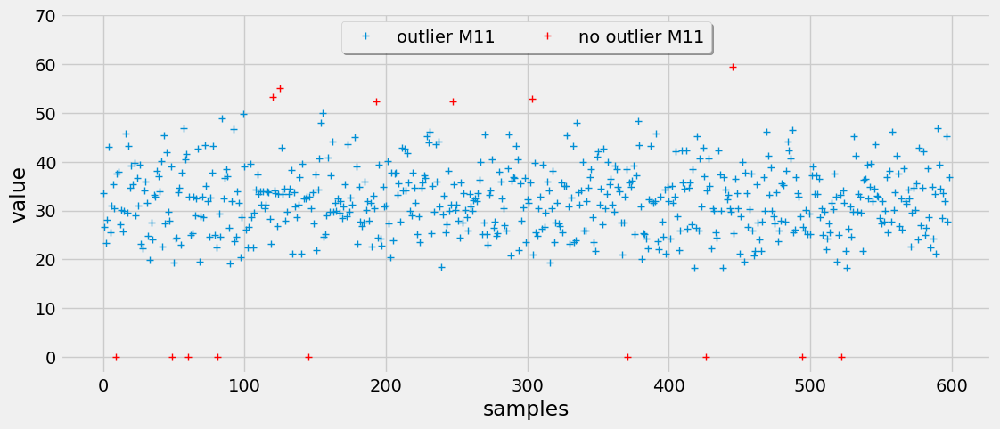

19 outliers in column BD2


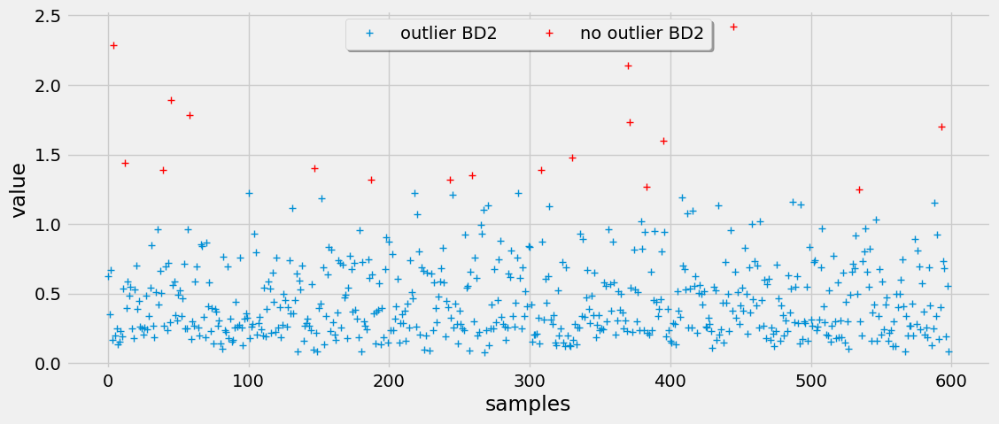

12 outliers in column Age


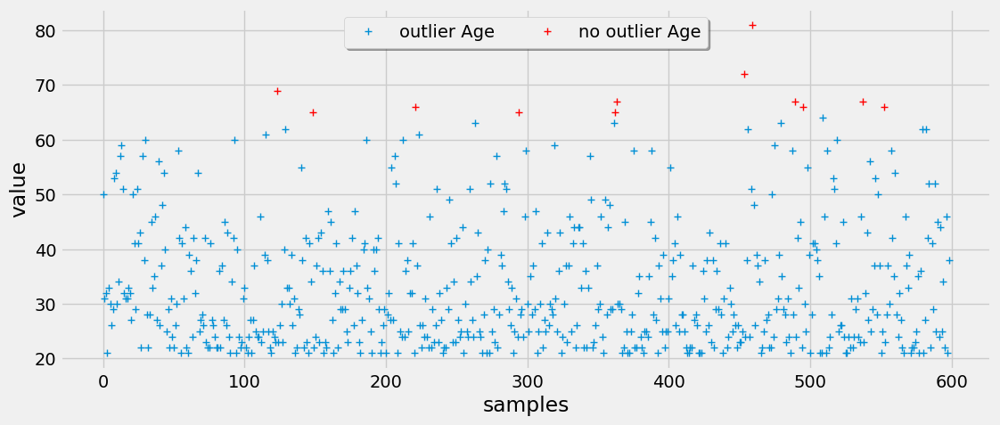

In [16]:
## plot outliers for each num variable using IQR method

for col in num_cols[1:]:
    data = mark_outliers_iqr(dataset=train_df, col=col)
    print(f"{data[col + '_outlier'].sum()} outliers in column {col}")
    plot_binary_outliers(dataset=data, col=col, outlier_col=col + "_outlier", reset_index=True)
    
    

- In some cases eg, PR, there seems to be clusters formed. 
- Let's investigate possible interaction effect with sepsis
- perhaps separating the data using the sepsis can help us to better deal with the outliers. 

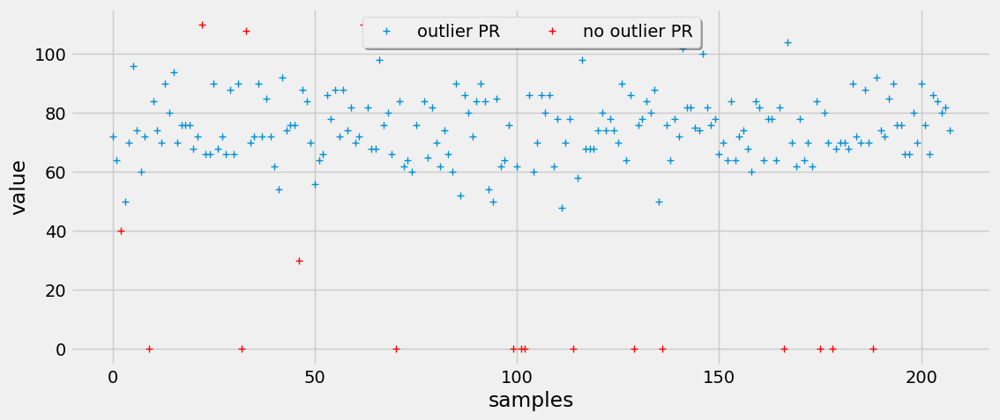

In [17]:
## plot the 2 classes of sepsis 

col = "PR" 
cls = "Positive"
data = mark_outliers_iqr(train_df[train_df["Sepssis"] == cls], col=col)
plot_binary_outliers(data, col=col, outlier_col=col + "_outlier", reset_index=True)

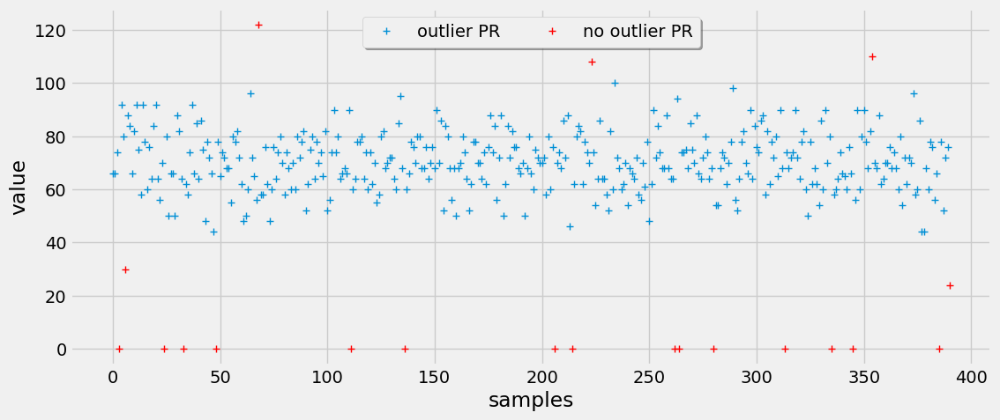

In [18]:
col = "PR" 
cls = "Negative"
data = mark_outliers_iqr(train_df[train_df["Sepssis"] == cls], col=col)
plot_binary_outliers(data, col=col, outlier_col=col + "_outlier", reset_index=True)

- the two classes of sepsis doesn't affect outlier locations. outliers are occur about equally for the two classes. 
- If the clusters were attributable to the the classes of Sepsis, then the outliers would represent important data points that reflect actual variation in the data and not anomalies or measurement errors

## 2 .   Data Cleaning 
There was no missing values in our data. So we handler outliers. 

- number of outliers are relatively small, and thus imputing outliers won't significantly affect feature distribution and we get to maintain our data size . 
- we impute using winsorization - a technique that involves setting outliers to be equal to some specified upper and lower bounds. 

In [19]:
train_df.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive


In [20]:
## define winsorization function

def winsorize_data(data: pd.DataFrame, cols: list) -> pd.DataFrame:
    
    winsorized_data = data.copy()
    
    for col in cols:
        for cls in ['Positive', 'Negative']:
        
            Q1 = data.loc[ (data["Sepssis"] == cls), col ].quantile(0.25)
            Q3 = data.loc[ (data["Sepssis"] == cls), col ].quantile(0.75)
            IQR = Q3 - Q1
            
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            

            winsorized_data.loc[ (data["Sepssis"] == cls), col ] = np.clip(data.loc[ (data["Sepssis"] == cls), col ], lower_bound, upper_bound) 
    
    return winsorized_data

- Initially, I didn't deal with outliers for the separate classes of `Sepsis`. 
- The possible effect of this was observed during cluster analysis and proved to signicantly affect my statistical tests as outliers resurfaced when I grouped feature values into the two classes of `Sepsis`
- These could have also affected model performance
- See how the range of the values changes signicantly after dealing with outliers separately

In [5]:
## winsorize data 

outliers_removed_df = winsorize_data(data=train_df, cols=num_cols)

NameError: name 'winsorize_data' is not defined

In [22]:
def plot_boxplot(col):
    _, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4) , sharey=True)
    sns.boxplot(data=train_df, x=col, y="Sepssis", ax=axes[0] );
    sns.boxplot(data=outliers_removed_df, x=col, y="Sepssis", ax=axes[1] );
    axes[0].set_title("Before dealing with outliers")
    axes[1].set_title("After dealing with outliers");

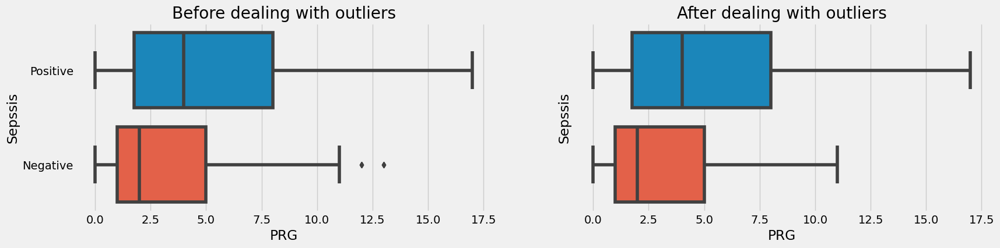

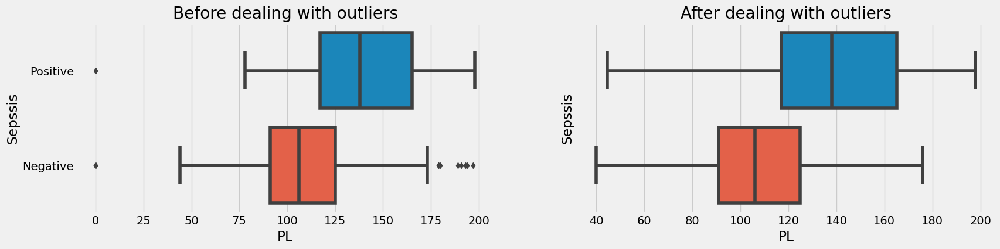

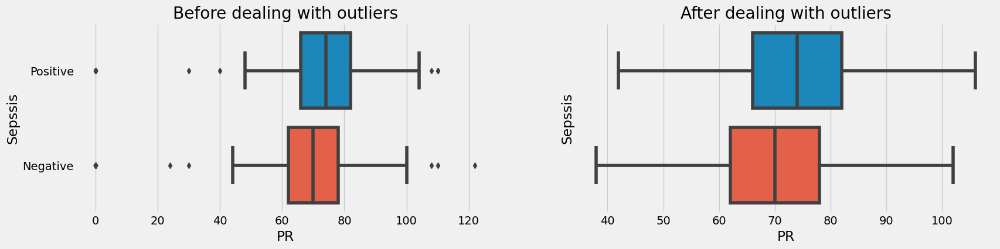

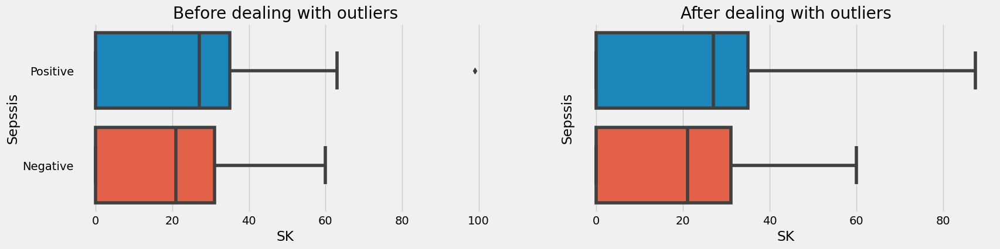

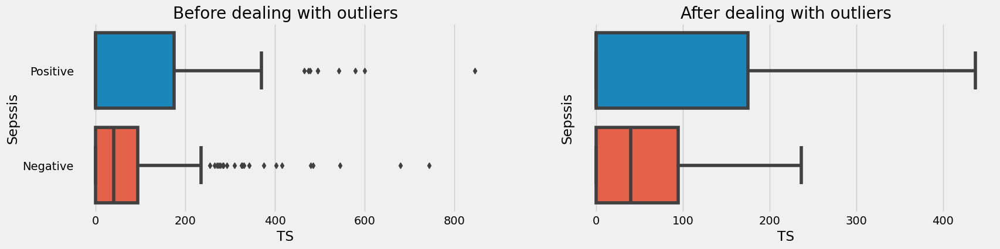

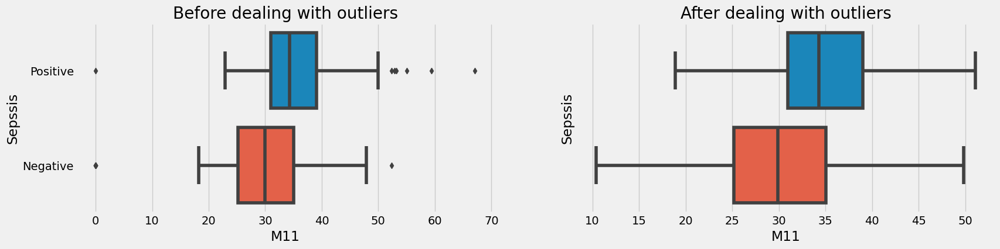

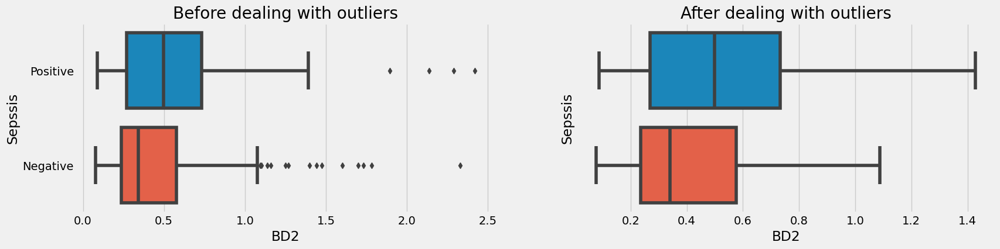

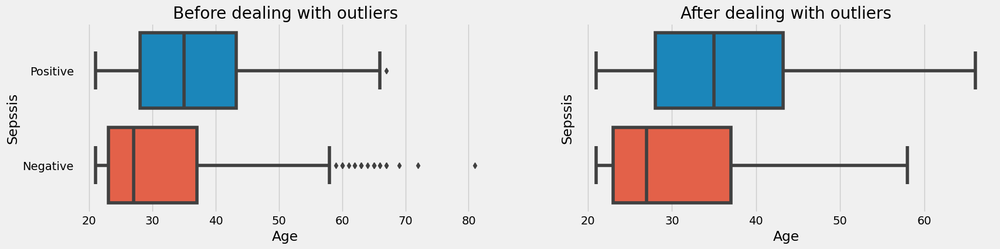

In [23]:
## plot outliers for each num variable using IQR method after imputing

for col in num_cols:
    plot_boxplot(col)

    

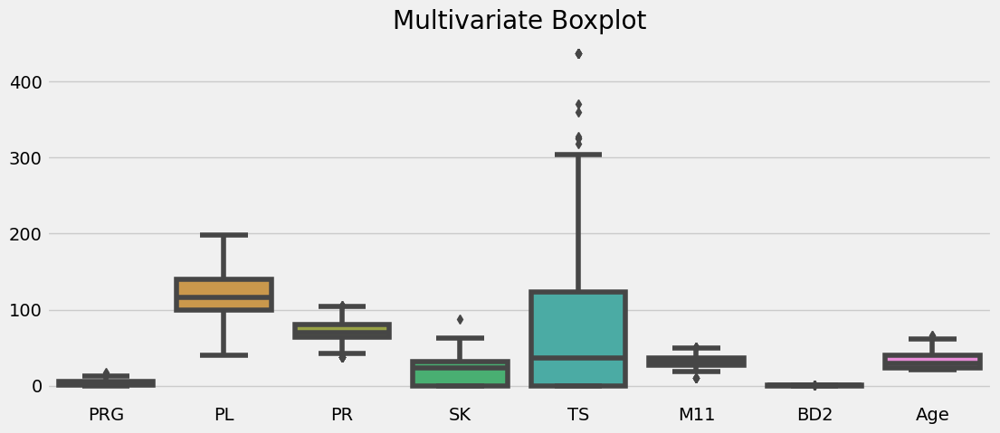

In [24]:
## check outliers 

sns.boxplot(outliers_removed_df[num_cols])
plt.title("Multivariate Boxplot");

- As may be expected, when the groups are put together, the presence of outliers are observed. 
- This is due to the heterogeneity of the two groups. 
- These are outliers reflects important variability in the data and need not to be imputed

In [25]:

outliers_removed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 599 entries, 0 to 598
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         599 non-null    object 
 1   PRG        599 non-null    int64  
 2   PL         599 non-null    float64
 3   PR         599 non-null    int64  
 4   SK         599 non-null    float64
 5   TS         599 non-null    float64
 6   M11        599 non-null    float64
 7   BD2        599 non-null    float64
 8   Age        599 non-null    float64
 9   Insurance  599 non-null    int64  
 10  Sepssis    599 non-null    object 
dtypes: float64(6), int64(3), object(2)
memory usage: 51.6+ KB


In [26]:
## save cleaned data
outliers_removed_df.to_pickle("../data/interim/outliers_removed_df.pkl")


In [6]:
data = pd.read_pickle("../data/interim/outliers_removed_df.pkl").drop("ID", axis=1)
data.head()

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,6,148.0,72,35.0,0.0,33.6,0.62700,50.0,0,Positive
1,1,85.0,66,29.0,0.0,26.6,0.35100,31.0,0,Negative
2,8,183.0,64,0.0,0.0,23.3,0.67200,32.0,1,Positive
3,1,89.0,66,23.0,94.0,28.1,0.16700,21.0,1,Negative
4,0,137.0,42,35.0,168.0,43.1,1.42875,33.0,1,Positive


## 3 . Bivariate and Multivariate Analysis 
***Identifying patterns and Exploring Relationships***

### a . Correlation Analysis

***Correlation Heatmap***

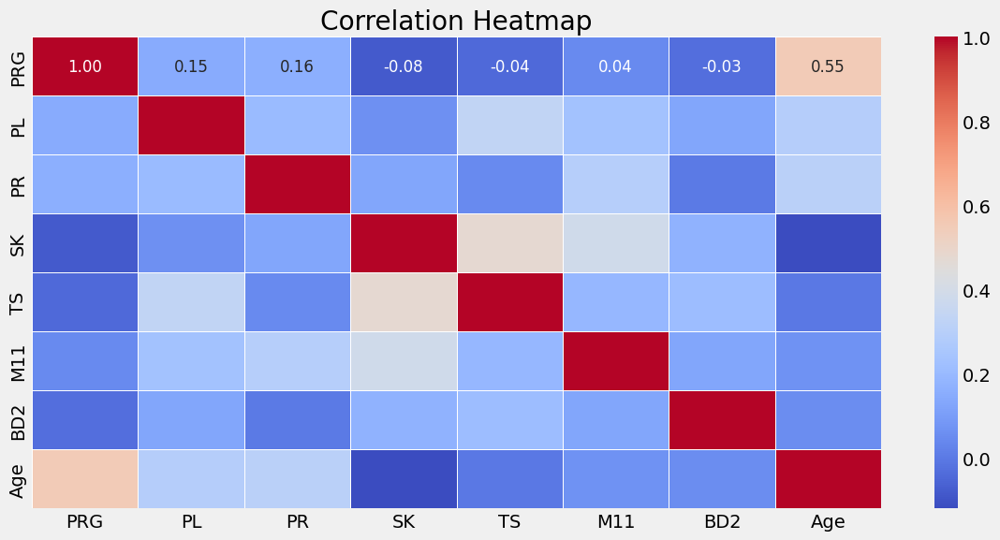

In [28]:
## Correlation heatmap
plt.rc("figure", autolayout=True)

plt.figure(figsize=(12, 6))
corr_matrix = data[num_cols].corr()
sns.heatmap(data=corr_matrix, annot=True, cmap="coolwarm", fmt=".2f",  linewidths=0.5, annot_kws={"size": 12})
plt.title("Correlation Heatmap");


- Generally, features seem to have low correlation, which implies they are likely to provide unique information to a model 
- Also it may be easier to interpret individual effects of features. 
- Since the number of features are also relatively small, we can use all features and avoid overfitting. 
- Let's investigate how these features affect `Sepsis`

***Mutual information (MI)***

- A general-purpose metric the describes relationships in terms of uncertainty. The MI between two quantities is a measure of the extent to which knowledge of one quantity reduces uncertainty about the other. 

- MI between two random variables is a non-negative value, which measures the dependency between the variables. 
- It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

- MI can't detect interaction effect. feature may be informative interacting with others but not so informative alone



In [29]:
## split data into feature matrix and target

X = data.copy()
y = X.pop("Sepssis") 

In [30]:
## preview split data

display(X.head())
y.head()

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,6,148.0,72,35.0,0.0,33.6,0.62700,50.0,0
1,1,85.0,66,29.0,0.0,26.6,0.35100,31.0,0
2,8,183.0,64,0.0,0.0,23.3,0.67200,32.0,1
3,1,89.0,66,23.0,94.0,28.1,0.16700,21.0,1
4,0,137.0,42,35.0,168.0,43.1,1.42875,33.0,1


0    Positive
1    Negative
2    Positive
3    Negative
4    Positive
Name: Sepssis, dtype: object

In [31]:
## calculate mutual info scores

mi_scores = pd.Series(mutual_info_classif(X, y), 
                      name="MI Scores", 
                      index=X.columns).sort_values(ascending=False)
mi_scores

PL           0.142309
TS           0.120077
M11          0.101665
Age          0.069842
PRG          0.060462
PR           0.056053
BD2          0.027403
SK           0.016488
Insurance    0.000000
Name: MI Scores, dtype: float64

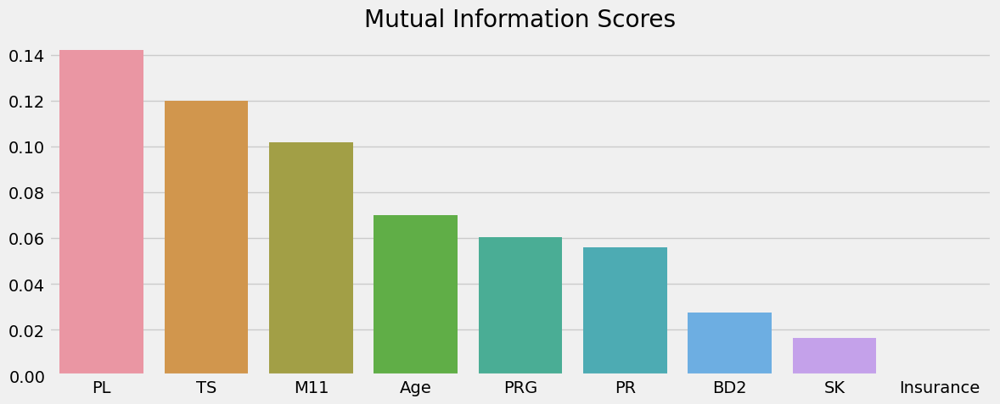

In [32]:
## visualize mi scores


sns.barplot(x=mi_scores.index,  y=mi_scores.values)
plt.title("Mutual Information Scores");

`PL -- Blodd Work Results-1` and `TS  -- Blood Work Result-3` exhibits the strongest relationship with `Sepsis`.  
- But does this mean a good predictive power of `Sepsis`?
- Let's compare the distribution of these features across the two classes of `Sepsis`
- Significant differences implies good predictive power of `Sepsis`

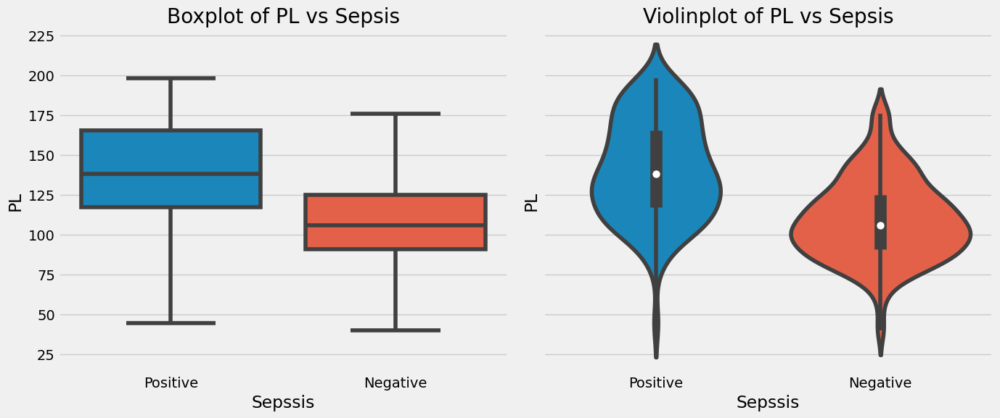

In [33]:
## violinplot and boxplot 
def box_violin_plot(col):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6), sharey=True  )
    sns.boxplot(x="Sepssis", y=col, data=data, ax=axes[0])
    axes[0].set_title(f"Boxplot of {col} vs Sepsis")
    sns.violinplot(x="Sepssis", y=col, data=data, ax=axes[1])
    axes[1].set_title(f"Violinplot of {col} vs Sepsis");
    

box_violin_plot(col="PL")


- From the boxplox, the two class seems to have significantly different quartiles, and dispersion.  
- The violinplot shows that the two classes seem to have different distribution shape
- If these differences are statistically significant, then ML model will find these useful in predicting classes. 



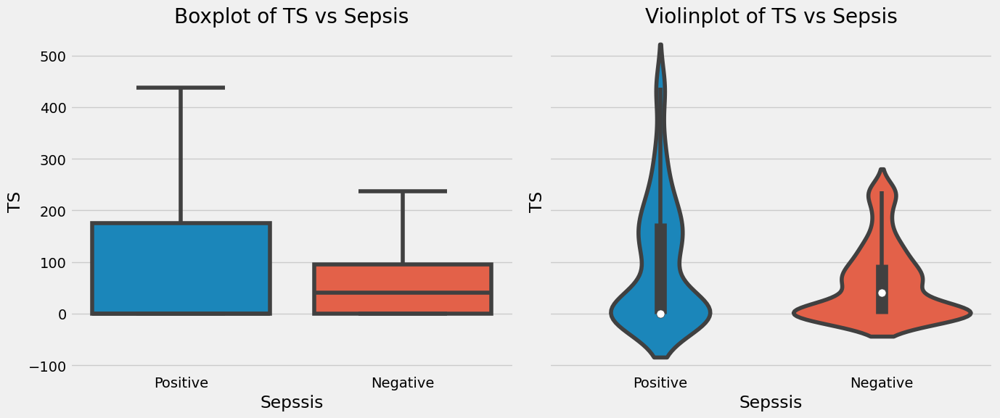

In [34]:
box_violin_plot(col="TS")

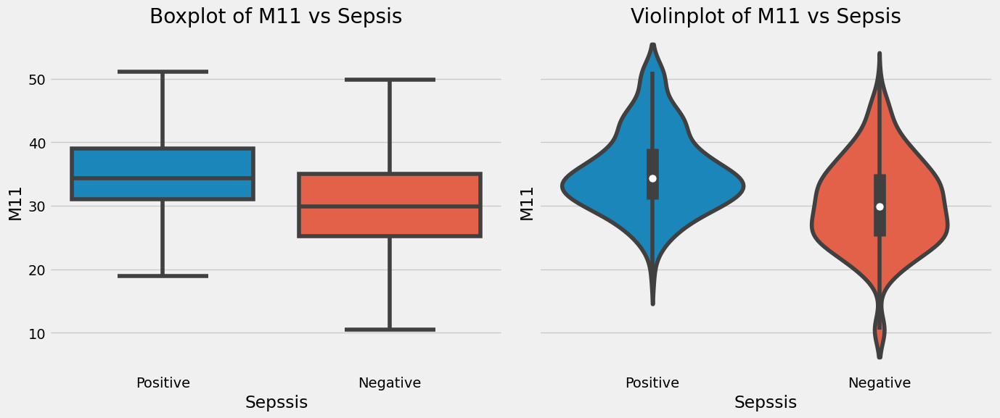

In [35]:
box_violin_plot(col="M11")

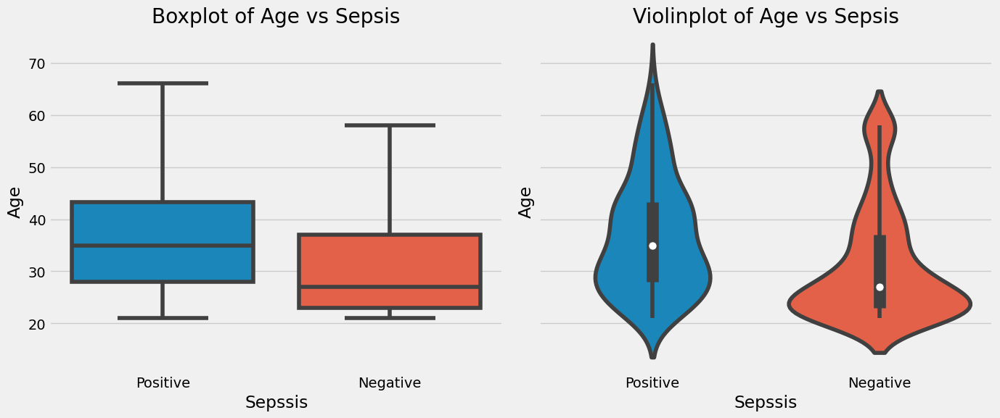

In [36]:
box_violin_plot(col="Age")

- Among variables with high MI Scores, there seems to be significant differences in the two classes of Sepssis
- These variables or some transformations of them is likely to have high predictive power.
- These have potential to improve model performance

### b . Interactions Effects



We analyse some interaction effects. from the correlation heatmap we see somehwat strong correlation between `Age` and `PRG` as well as `SK` and `TS`

***Pairplots***

From the correlation heatmap, we evaluate the discriminatory power of pairs of variables with high correlation 

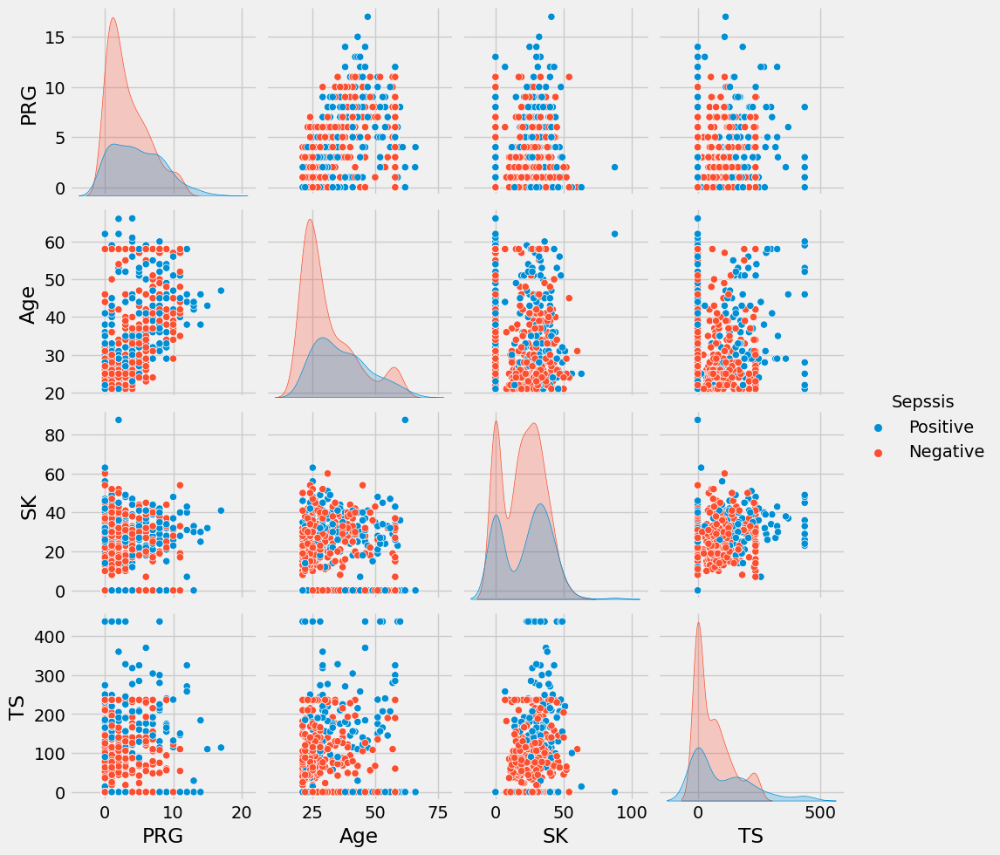

In [37]:
cols = ["PRG", "Age", "SK", "TS", "Sepssis"]

sns.pairplot(data[cols], hue="Sepssis");

- Among pairs of variables with correlation scores, there isn't clear clusters form
- This may mean that the pairs of variables have low discriminatory power. this is reflected in how the two classes of sepssis overlap in distribution
- we see high variability in the two classes making it difficult for clear clusters to be formed
- Effective feature engineering and systematic feature selection is essential to improve model performance

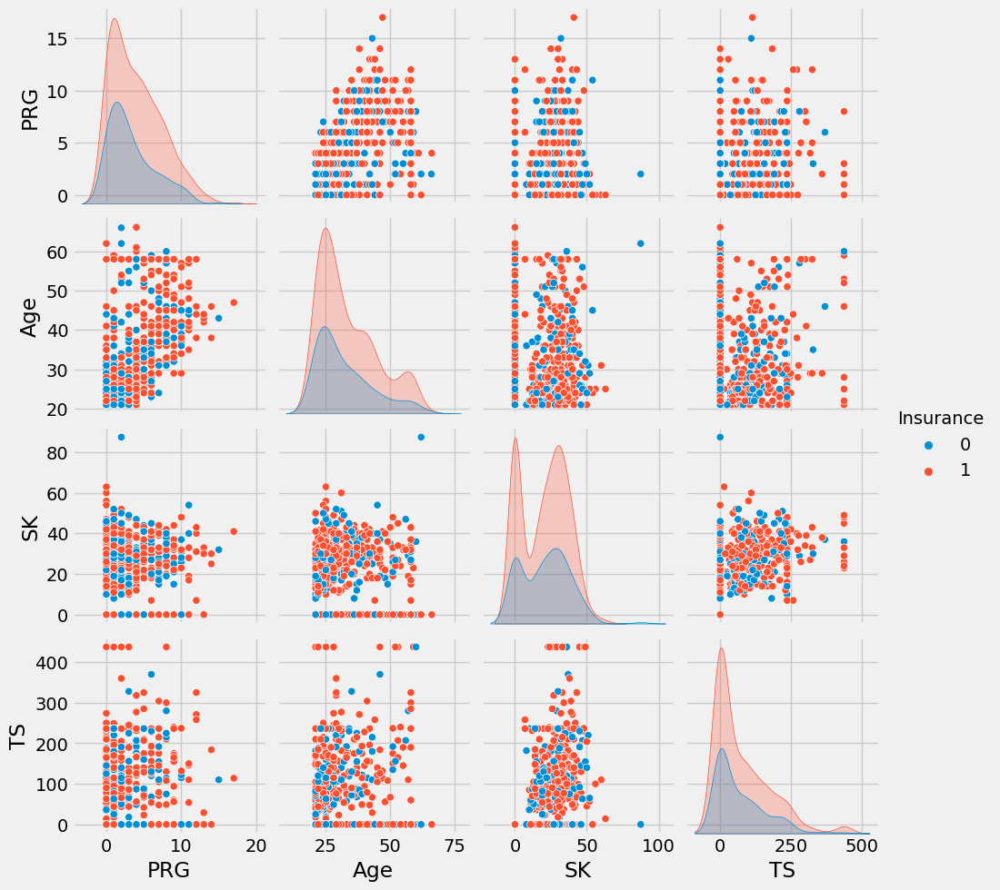

In [38]:
cols = ["PRG", "Age", "SK", "TS", "Insurance"]

sns.pairplot(data[cols], hue="Insurance");

- no observable clusters when `Insurance` is used as hue either
- `Insurance` doesn't have interaction effection and also have low MI Score
- `Insurance` will likely not improve model performance as it has low predictive power as well as discriminatory power

In [39]:
# fig, ax = plt.subplots(figsize=(10, 6))

def plot_lm(col1, col2, hue):
    sns.lmplot(x=col1, y=col2, hue=hue, data=data)

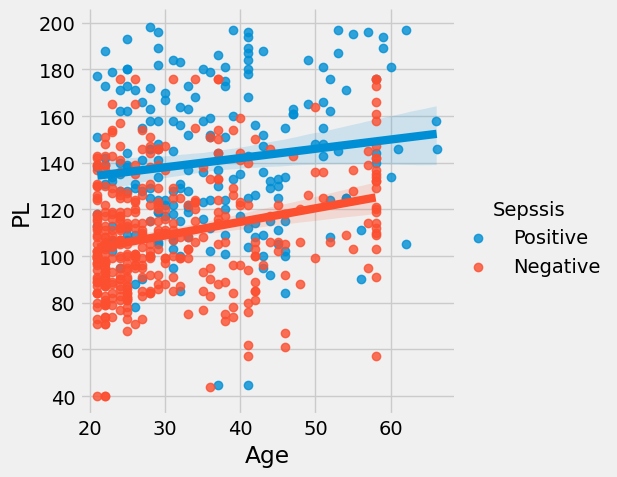

In [40]:
    
plot_lm(col1="Age", col2="PL", hue="Sepssis")

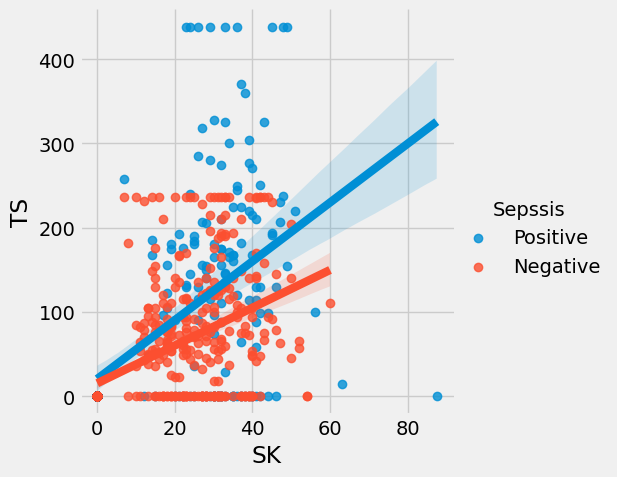

In [41]:
plot_lm(col1="SK", col2="TS", hue="Sepssis")

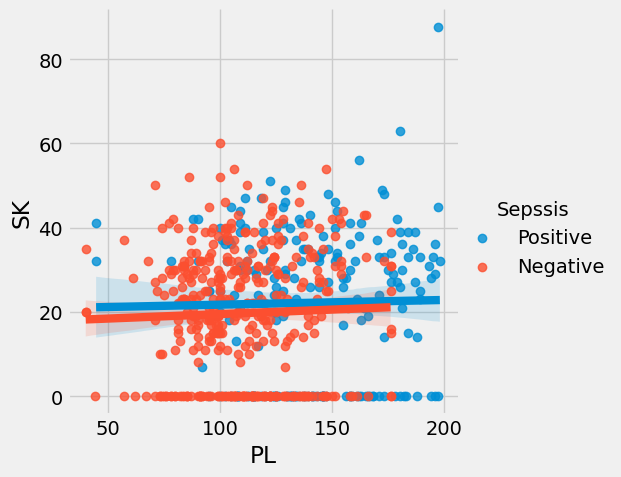

In [42]:
plot_lm(col1="PL", col2="SK", hue="Sepssis")

There isn't clear clusters that form when using `Sepssis` as a third variable for many pairs

### c . Dimentionality Reduction 

***Principal Component Analysis***

PCA is a technique used in machine learning to reduce the complexity of data by transforming the data into a new set of variables called principal components. This transformation is done in such a way that the new set of variables captures the most amount of information from the original data set, while reducing the number of variables necessary. This helps to reduce the complexity of the data and make it easier to analyze and make predictions from.

<img src="../reports/img/pca.PNG" width="40%" height="20%">

In [4]:
## Define PCA class to streamline work. 
# Source: Machine Learning for the Quantified Self, Mark Hoogendoorn and Burkhardt Funk (2017), Chap 3 (modified for my purpose)

# Class for Principal Component Analysis. We can only apply this when we do not have missing values (i.e. NaN).
# For this we have to impute these first, be aware of this.


class PrincipalComponentAnalysis:

    def __init__(self):
        self.pca = None
        self.scaler = None

    def normalize_dataset(self, data_table, columns):
        dt_norm = copy.deepcopy(data_table)
        # for col in columns:
        #     dt_norm[col] = (data_table[col] - data_table[col].mean()) / (
        #         data_table[col].max()
        #         - data_table[col].min()
        #         # data_table[col].std()
        #     )
        self.scaler = MinMaxScaler()
        dt_norm[columns] = pd.DataFrame(self.scaler.fit_transform(data[columns]), columns=columns)
        return dt_norm

    # Perform the PCA on the selected columns and return the explained variance.
    def determine_pc_explained_variance(self, data_table, cols):

        # Normalize the data first.
        dt_norm = self.normalize_dataset(data_table, cols)

        # perform the PCA.
        self.pca = PCA(n_components=len(cols))
        self.pca.fit(dt_norm[cols])
        # And return the explained variances.
        return self.pca.explained_variance_ratio_

    # Apply a PCA given the number of components we have selected.
    # We add new pca columns.
    def apply_pca(self, data_table, cols, number_comp):

        # Normalize the data first.
        dt_norm = self.normalize_dataset(data_table, cols)

        # perform the PCA.
        self.pca = PCA(n_components=number_comp)
        self.pca.fit(dt_norm[cols])

        # Transform our old values.
        new_values = self.pca.transform(dt_norm[cols])

        # And add the new ones:
        for comp in range(0, number_comp):
            data_table["pca_" + str(comp + 1)] = new_values[:, comp]

        return data_table



In [7]:
## experiment with actual data and data with removed outliers
## as well as different scaling methods

df_pca = data.copy() # helps to reset our data
pca_instance = PrincipalComponentAnalysis() # instantiate

In [8]:
pca_values = pca_instance.determine_pc_explained_variance(data_table=df_pca, cols=num_cols)
pca_values

array([0.27799045, 0.22854451, 0.12597479, 0.10873626, 0.09092463,
       0.0710141 , 0.05528322, 0.04153205])

- 8 components as expected. since we have 8 numerical columns
- But the objective of dimensionality reduction is to reduce the number of variables. 
- We estimate the optimal number of components to use using the ***Elbow Technique***

***Determine Optimal number of Principal Components -- Elbow Technique***

The elbow technique is a method used to determine the optimal number of components to use when conducting a PCA. It works by testing multiple different component numbers and then evaluating the variance captured by each component number. The optimal component number is then chosen as the number of components that capture the most variance while also not incorporating too many components. This is done by plotting the variance captured against the component number and then selecting the point at which the rate of change in variance diminishes (the "elbow"), as this is typically the point at which adding more components does not significantly improve the analysis.


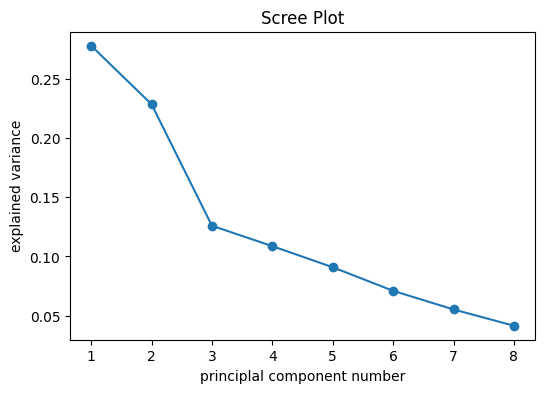

In [149]:
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(num_cols) + 1), pca_values, marker="o")
plt.xlabel("principlal component number")
plt.ylabel("explained variance")
plt.title("Scree Plot");


- By the elbow method, we choose 3 components. 
- Adding more components may result in overfitting or caturing noise in the data. 

In [121]:
def total_ev(pca_values, k):
    print(f"total ev with {k} components: {pca_values[:k].sum() * 100:.2f}%")

In [126]:
total_ev(pca_values, 2)
total_ev(pca_values, 3)
total_ev(pca_values, 4)
total_ev(pca_values, 5)
total_ev(pca_values, 6)

total ev with 2 components: 50.65%
total ev with 3 components: 63.25%
total ev with 4 components: 74.12%
total ev with 5 components: 83.22%
total ev with 6 components: 90.32%


| Dataset | StandardScaler | RobustScaler | MinMaxScaler |PCA Components|
|---------|----------------|--------------|--------------|------------------------|
| Data with outliers    |       61.55%        |       62.47%       |      63.81%       |          3          |
| Data without outliers       |       61.55%        |      62.47%       |      63.25%       |           3            |         
| Data with outliers    |        72.20%        |     73.62%      |      74.34%       |          4          |
| Data without outliers       |       72.20%        |   73.62%         |      74.12%       |           4            |         


- for visualization we can settle for less. 
- but to improve predictive power, we may need more. 

***Apply PCA***

In [9]:
df_pca = pca_instance.apply_pca(df_pca, num_cols, 5)
df_pca

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,pca_1,pca_2,pca_3,pca_4,pca_5
0,6,148.0,72,35.0,0.0,33.6,0.62700,50.0,0,Positive,0.386893,-0.101525,0.098509,-0.084066,0.016778
1,1,85.0,66,29.0,0.0,26.6,0.35100,31.0,0,Negative,-0.270314,-0.104672,-0.027902,-0.069415,0.111628
2,8,183.0,64,0.0,0.0,23.3,0.67200,32.0,1,Positive,0.124410,-0.196245,0.289869,0.155440,-0.306461
3,1,89.0,66,23.0,94.0,28.1,0.16700,21.0,1,Negative,-0.386966,0.035793,-0.166647,0.093462,0.082263
4,0,137.0,42,35.0,168.0,43.1,1.42875,33.0,1,Positive,0.026713,0.604190,0.612364,-0.124143,-0.009944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,6,123.0,72,45.0,230.0,33.6,0.73300,34.0,0,Negative,0.214150,0.383508,0.079020,0.059297,0.228420
595,0,188.0,82,14.0,185.0,32.0,0.68200,22.0,1,Positive,0.030605,0.407243,0.001980,0.085342,-0.462084
596,0,67.0,76,0.0,0.0,45.3,0.19400,46.0,1,Negative,-0.010589,-0.293146,-0.210836,-0.248313,0.036264
597,1,89.0,38,19.0,25.0,27.8,0.55900,21.0,0,Negative,-0.521076,0.013073,0.265686,0.086784,0.098005


In [10]:
df_pca.to_pickle("../data/interim/df_pca.pkl")

In [11]:
df_pca = pd.read_pickle("../data/interim/df_pca.pkl")
df_pca.head()

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,pca_1,pca_2,pca_3,pca_4,pca_5
0,6,148.0,72,35.0,0.0,33.6,0.62700,50.0,0,Positive,0.386893,-0.101525,0.098509,-0.084066,0.016778
1,1,85.0,66,29.0,0.0,26.6,0.35100,31.0,0,Negative,-0.270314,-0.104672,-0.027902,-0.069415,0.111628
2,8,183.0,64,0.0,0.0,23.3,0.67200,32.0,1,Positive,0.124410,-0.196245,0.289869,0.155440,-0.306461
3,1,89.0,66,23.0,94.0,28.1,0.16700,21.0,1,Negative,-0.386966,0.035793,-0.166647,0.093462,0.082263
4,0,137.0,42,35.0,168.0,43.1,1.42875,33.0,1,Positive,0.026713,0.604190,0.612364,-0.124143,-0.009944


### d . Cluster Analysis
***K-Means Clustering***

K-means clustering is an unsupervised machine learning algorithm used to group data into clusters based on similarity. It randomly initializes k points (centroids) in the data space, calculates the distance between each data point and each centroid, and assigns each point to its closest centroid. K-means clustering is a popular feature engineering technique used in many applications such as identifying the most important features in a dataset, segmenting customers into different clusters based on their purchase behaviors, anomaly detection, and image compression.

The Elbow Method, also known as the “elbow curve technique” , is again used to determine the optimal number of clusters for a given dataset. It plots the Inertia (sum of squared distances of samples to their closest cluster center) for each k (number of clusters) against k and looks for the “elbow” point in the plot; this point represents the optimal number of clusters. The elbow method works by looping through different values of k and calculating the sum of squared errors for each iteration.

In [12]:
## make a copy of data
df_cluster = df_pca.copy()

- Since K-means is a distance based algo, we normalize the data

In [13]:
## normalize data 

scaler = MinMaxScaler()
df_cluster[num_cols] = pd.DataFrame(scaler.fit_transform(df_cluster[num_cols]), columns=num_cols)
df_cluster


,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,pca_1,pca_2,pca_3,pca_4,pca_5
0,0.352941,0.683544,0.500000,0.400000,0.000000,0.569760,0.406441,0.642659,0,Positive,0.386893,-0.101525,0.098509,-0.084066,0.016778
1,0.058824,0.284810,0.411765,0.331429,0.000000,0.397664,0.202110,0.221607,0,Negative,-0.270314,-0.104672,-0.027902,-0.069415,0.111628
2,0.470588,0.905063,0.382353,0.000000,0.000000,0.316533,0.439756,0.243767,1,Positive,0.124410,-0.196245,0.289869,0.155440,-0.306461
3,0.058824,0.310127,0.411765,0.262857,0.214857,0.434542,0.065889,0.000000,1,Negative,-0.386966,0.035793,-0.166647,0.093462,0.082263
4,0.000000,0.613924,0.058824,0.400000,0.384000,0.803319,1.000000,0.265928,1,Positive,0.026713,0.604190,0.612364,-0.124143,-0.009944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.352941,0.525316,0.500000,0.514286,0.525714,0.569760,0.484916,0.288089,0,Negative,0.214150,0.383508,0.079020,0.059297,0.228420
595,0.000000,0.936709,0.647059,0.160000,0.422857,0.530424,0.447159,0.022161,1,Positive,0.030605,0.407243,0.001980,0.085342,-0.462084
596,0.000000,0.170886,0.558824,0.000000,0.000000,0.857406,0.085878,0.554017,1,Negative,-0.010589,-0.293146,-0.210836,-0.248313,0.036264
597,0.058824,0.310127,0.000000,0.217143,0.057143,0.427167,0.356098,0.000000,0,Negative,-0.521076,0.013073,0.265686,0.086784,0.098005


In [17]:
#experiment with differnt column sets, number of clusters and inertias

def optimal_cluster_calculator( cluster_columns):
    
    k_values = range(2, 10)
    inertias = []

    for k in k_values:
        subset = df_cluster[cluster_columns]
        kmeans_instance = KMeans(n_clusters=k, n_init=20, random_state=42)
        kmeans_instance.fit(subset)
        inertias.append(round(kmeans_instance.inertia_, 2))
        
    plt.figure(figsize =(6,4))
    plt.plot(k_values, inertias, marker="o")
    plt.xlabel("numbr of clustrs(k)")
    plt.ylabel("Sum of Squared distances")
    plt.title(f"Scree Plot {cluster_columns}");
    
    print(inertias)
    

We cluster based on some set of clumns: 

- **Set 1 (Highest MI Scores): ["PL", "TS", "M11"]**

    Features with highest MI Scores. they are the features sepsis depends on the most according the MI metric

- **Set 2 (Blood Test Results and Body Mass Index): ["PL", "SK", "TS", "BD2", "M11"]**

    Blood test results can provide insights into a patient's physiological state, such as hormone levels, blood cell counts, or metabolic markers. Combining these with BMI can help identify clustrs of patients based on their metabolic health or specific blood profile characteristics

- **Set 3(Blood Test Results): ["PL", "SK", "TS", "BD2", "]**  combining all blood work results (PL, SK, TS, BD2) can provide a detailed profile of patients' physiological markers.

- **Set 4(Glucose Levels and Blood Pressure): ["PRG", "PR"]**

    Combining plasma glucose levels (PRG) with blood pressure (PR) can be insightful for clustering patients based on potential risk factors related to metabolic disorders or cardiovascular health.

- **Set 5 (Blood Test Results and Age): ["PL", "SK", "Age]**

    Analyzing blood test results (PL, SK) in conjunction with patients' age can reveal age-related patterns in blood markers. This set can be particularly useful for identifying clusters related to age-related health conditions or different physiological stages across age groups.

**Set 6 (Principal Components)**
    
    PCA can retain important information for clustering.

NB: The above sets were continuously refined based on outputs

In [24]:

cluster_columns1 = ["PRG", "PR"]
cluster_columns2 = ["PRG", "PR", "M11"]
cluster_columns3 = ["PRG", "PR", "Age"]
 
clusters = [cluster_columns1, 
            cluster_columns2, 
            cluster_columns3, 
            ]

Inertia for each k for cluster_columns1(['PRG', 'PR']):


[27.98, 18.32, 14.29, 11.58, 9.62, 8.19, 7.28, 6.44]

Inertia for each k for cluster_columns2(['PRG', 'PR', 'M11']):
[45.75, 34.14, 29.61, 25.92, 23.47, 21.1, 19.32, 17.92]

Inertia for each k for cluster_columns3(['PRG', 'PR', 'Age']):
[43.82, 34.61, 27.9, 24.11, 21.21, 19.07, 17.31, 16.01]



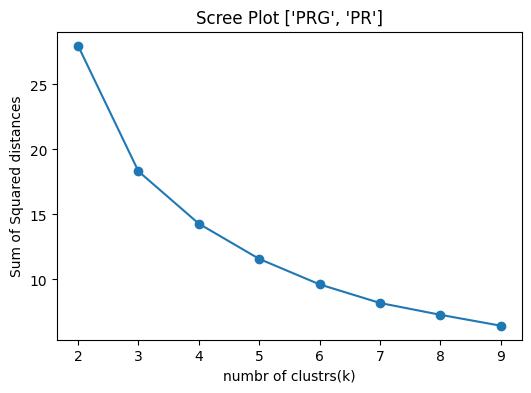

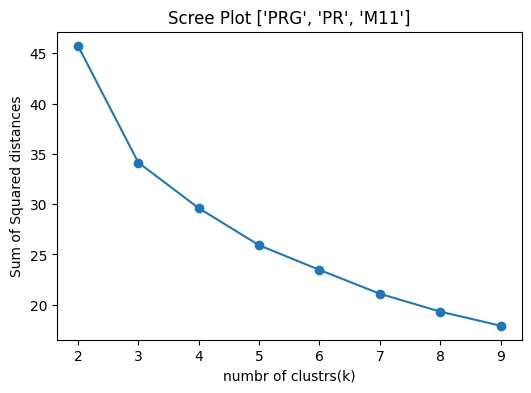

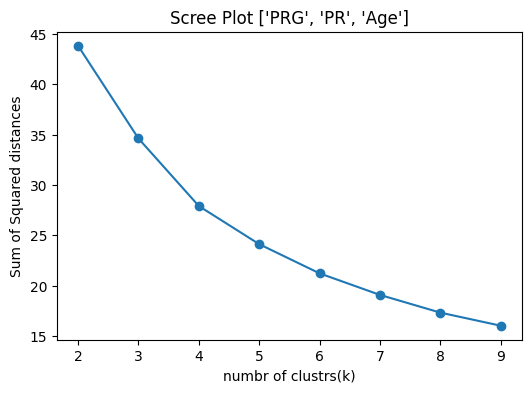

In [25]:
for i, cluster in enumerate(clusters):
    print(f"Inertia for each k for cluster_columns{i+1}({cluster}):")
    optimal_cluster_calculator(cluster) 
    print()

- cluster_columns4(['PRG', 'PR']) happens to be the best columns to perform the cluster on based on inertia
- we visualize the clusters to decide on how many clusters to use. 

In [26]:
kmeans_instance = KMeans(n_clusters=5, n_init=20, random_state=42)
df_cluster["Cluster"] = kmeans_instance.fit_predict(df_cluster[["PRG", "PR"]])
df_cluster.head()


,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,pca_1,pca_2,pca_3,pca_4,pca_5,Cluster
0,0.352941,0.683544,0.500000,0.400000,0.000000,0.569760,0.406441,0.642659,0,Positive,0.386893,-0.101525,0.098509,-0.084066,0.016778,3
1,0.058824,0.284810,0.411765,0.331429,0.000000,0.397664,0.202110,0.221607,0,Negative,-0.270314,-0.104672,-0.027902,-0.069415,0.111628,0
2,0.470588,0.905063,0.382353,0.000000,0.000000,0.316533,0.439756,0.243767,1,Positive,0.124410,-0.196245,0.289869,0.155440,-0.306461,3
3,0.058824,0.310127,0.411765,0.262857,0.214857,0.434542,0.065889,0.000000,1,Negative,-0.386966,0.035793,-0.166647,0.093462,0.082263,0
4,0.000000,0.613924,0.058824,0.400000,0.384000,0.803319,1.000000,0.265928,1,Positive,0.026713,0.604190,0.612364,-0.124143,-0.009944,4


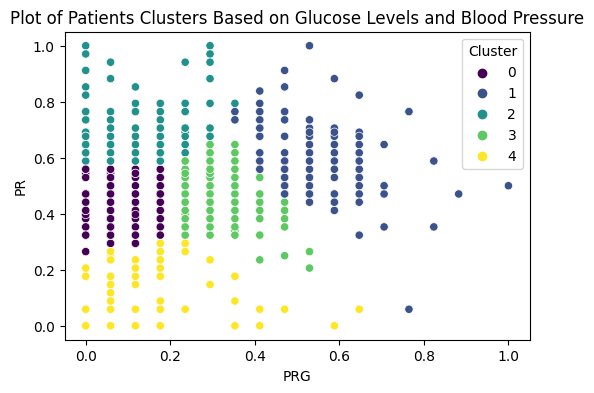

In [30]:
## plot clusters
plt.figure(figsize=(6, 4))
sns.scatterplot(data=df_cluster, x="PRG", y="PR", hue="Cluster", palette="viridis")
plt.title("Plot of Patients Clusters Based on Glucose Levels and Blood Pressure");

- From the way the clusters do not overlap, we can suspect this will be a good feature for our ML model 

In [31]:
df_cluster.to_pickle("../data/interim/df_cluster.pkl")

In [32]:
df_cluster = pd.read_pickle("../data/interim/df_cluster.pkl")
df_cluster

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,pca_1,pca_2,pca_3,pca_4,pca_5,Cluster
0,0.352941,0.683544,0.500000,0.400000,0.000000,0.569760,0.406441,0.642659,0,Positive,0.386893,-0.101525,0.098509,-0.084066,0.016778,3
1,0.058824,0.284810,0.411765,0.331429,0.000000,0.397664,0.202110,0.221607,0,Negative,-0.270314,-0.104672,-0.027902,-0.069415,0.111628,0
2,0.470588,0.905063,0.382353,0.000000,0.000000,0.316533,0.439756,0.243767,1,Positive,0.124410,-0.196245,0.289869,0.155440,-0.306461,3
3,0.058824,0.310127,0.411765,0.262857,0.214857,0.434542,0.065889,0.000000,1,Negative,-0.386966,0.035793,-0.166647,0.093462,0.082263,0
4,0.000000,0.613924,0.058824,0.400000,0.384000,0.803319,1.000000,0.265928,1,Positive,0.026713,0.604190,0.612364,-0.124143,-0.009944,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.352941,0.525316,0.500000,0.514286,0.525714,0.569760,0.484916,0.288089,0,Negative,0.214150,0.383508,0.079020,0.059297,0.228420,3
595,0.000000,0.936709,0.647059,0.160000,0.422857,0.530424,0.447159,0.022161,1,Positive,0.030605,0.407243,0.001980,0.085342,-0.462084,2
596,0.000000,0.170886,0.558824,0.000000,0.000000,0.857406,0.085878,0.554017,1,Negative,-0.010589,-0.293146,-0.210836,-0.248313,0.036264,0
597,0.058824,0.310127,0.000000,0.217143,0.057143,0.427167,0.356098,0.000000,0,Negative,-0.521076,0.013073,0.265686,0.086784,0.098005,4


## 4 . Make and Test Hypothesis

We test a refined version of the initial hypothesis 

Null Hypothesis (H0): There is NO SIGNIFICANT DIFFERENCE in the means of PL(Blood Work Result-1) and TS(Blood Work Result-3) between patients with positive sepsis and patients with negative sepsis.

Alternative Hypothesis (H1): There is A SIGNIFICANT DIFFERENCE in the means of PL(Blood Work Result-1) and TS(Blood Work Result-3) between patients with positive sepsis and patients with negative sepsis.



### a. Assumptions and Test Selection

- Both normality and homoscedasticity -- use independent t-test
- only normality -- use welsh's t-test (robust to the assumption of homoscedasticity)
- no normality -- use Mann-Whitney U test ( Non-parametric)

In [43]:
## prepare data: obtain the two groups for each variable

pos_group_PL = data[data["Sepssis"] == "Positive"]["PL"]
neg_group_PL = data[data["Sepssis"] == "Negative"]["PL"]
pos_group_TS = data[data["Sepssis"] == "Positive"]["TS"]
neg_group_TS = data[data["Sepssis"] == "Negative"]["TS"]

***Normality inspection***

In [44]:
## define function to visualize distribution and qqplot

def kde_qqplot(data: pd.Series, col: list, group_name: str):
    _, ax = plt.subplots( figsize=(8, 4))
    sns.kdeplot(data=data, fill=True, ax=ax)
    ax.set_title(f"Density plot of {group_name}");
    
    pplot(pd.DataFrame(data, columns=col), x=col[0], y=norm, 
        kind="qq", aspect=2, height=4, display_kws={"identity":True})
    plt.title(f"Q-Q plot of {group_name}");

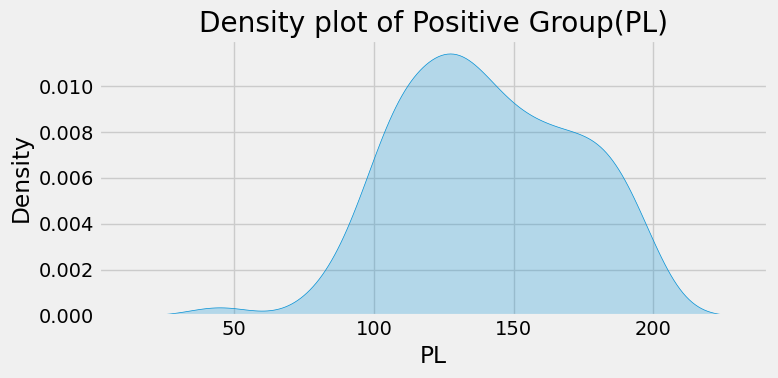

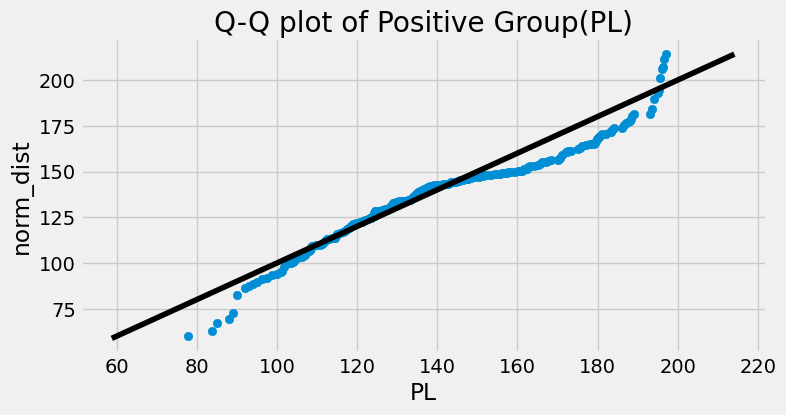

In [45]:
kde_qqplot(pos_group_PL, col=["PL"], group_name="Positive Group(PL)")

Doesn't look quite normal as there are observable deviations in both the kde and qq plot

- It's not quite clear from the visualizations whether the groups are normal. 
- For a conclusive inference, we conduct a normality test

In [46]:
## define noramlity test function

def normality_test(data, group_name, alpha=0.05):

    print("----" * 11 )
    print(f"Normality Test results for {group_name}")
    
    print("----" * 11)
    
    # Perform Shapiro-Wilk test
    statistic, p_value = shapiro(data)
    print(f"Shapiro-Wilk Test Statistic: {statistic:.3f}")
    print(f"P-value: {p_value:.3f}")

    # Interpret the results
    alpha = 0.05
    if p_value < alpha:
        print("Reject null hypothesis: Data is not normally distributed.")
    else:
        print("Fail to reject null hypothesis: Data is normally distributed.")

In [47]:
normality_test(pos_group_PL, "Positive Group(PL)")

--------------------------------------------
Normality Test results for Positive Group(PL)
--------------------------------------------
Shapiro-Wilk Test Statistic: 0.976
P-value: 0.001
Reject null hypothesis: Data is not normally distributed.


In [48]:
normality_test(neg_group_PL, "Negative Group(PL)")

--------------------------------------------
Normality Test results for Negative Group(PL)
--------------------------------------------
Shapiro-Wilk Test Statistic: 0.983
P-value: 0.000
Reject null hypothesis: Data is not normally distributed.


***Data Transformation***

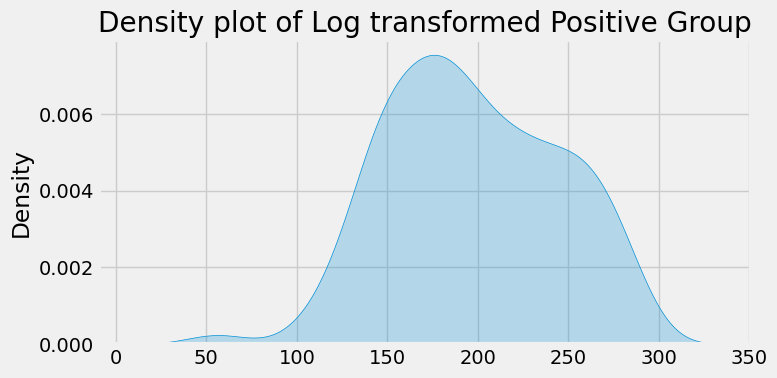

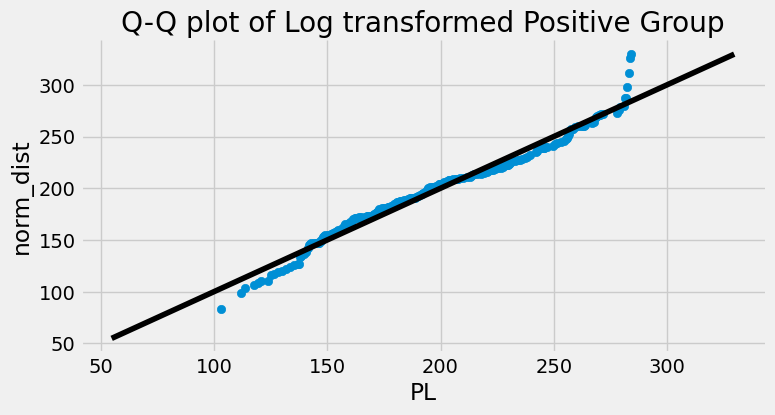

In [49]:
transformed_data, _ = boxcox(pos_group_PL)
kde_qqplot(data=transformed_data, col=["PL"], group_name="Log transformed Positive Group")

- non normality not resolved after transformation of `PL`
- We take a non parametric test approach 

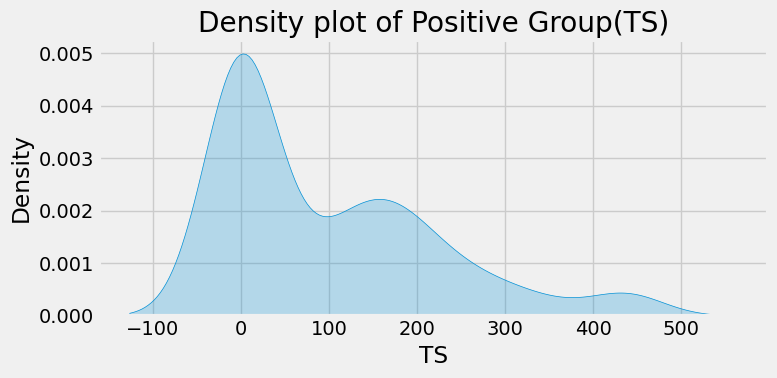

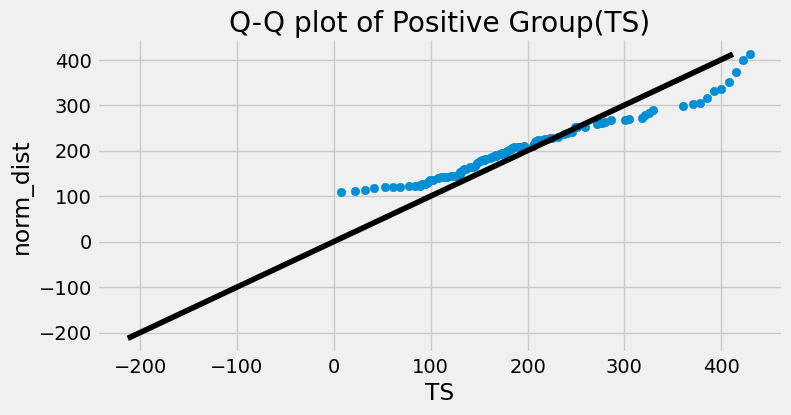

In [50]:
kde_qqplot(pos_group_TS, col=["TS"], group_name="Positive Group(TS)")

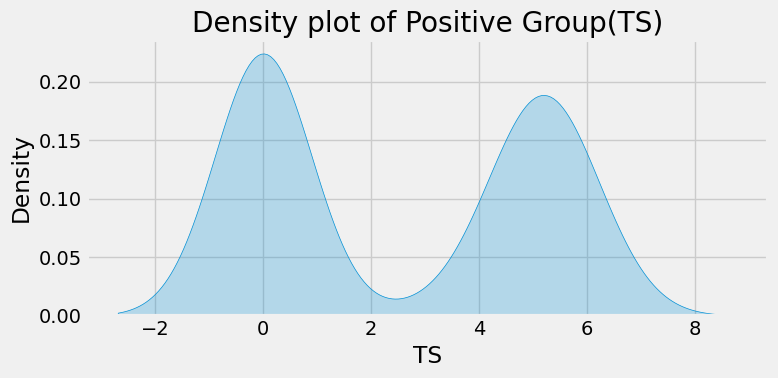

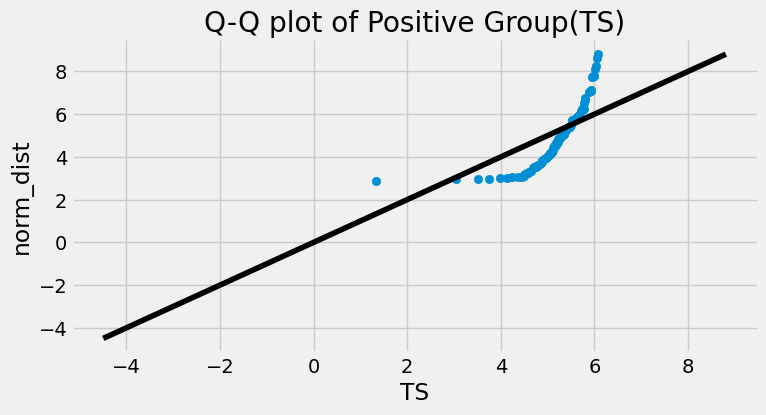

In [51]:
transformed_data = np.log1p(pos_group_TS)
kde_qqplot(transformed_data, col=["TS"], group_name="Positive Group(TS)")

In [54]:
#     ## define homoscedasticity test function

# def homoscedasticity_test(group1, group2, alpha=0.05):
    
#     # Perform Levene's test
#     statistic, p_value = levene(group1, group2)
#     print(f"Levene's Test Statistic: {statistic}")
#     print(f"P-value: {p_value}")

#     # Interpret the results
#     alpha = 0.05
#     if p_value < alpha:
#         print("Reject null hypothesis: Variances are not equal.")
#     else:
#         print("Fail to reject null hypothesis: Variances are equal.")

- Due to the failed assumptions, we perform a non parameric test

### b. Perform the Test

In [55]:
def perform_test(group1, group2, var_name, alpha=0.05):
    
    print("------" * 10 )
    print(f"Mann-Whitney U Test results for {var_name}")
    
    print("------" * 10)
    
    # Perform Mann-Whitney U test
    u_stat, p_val = mannwhitneyu(group1, group2)
    print(f"U-statistic: {u_stat:.3f}")
    print(f"P-value: {p_val:.3f}")

    # Interpret results
    alpha = 0.05
    if p_val < alpha:
        print("Reject null hypothesis: There is a significant difference.")
    else:
        print("Fail to reject null hypothesis: No significant difference.")

In [56]:
## perform test for PL 

perform_test(group1=pos_group_PL, group2=neg_group_PL, var_name="PL(Blood Work Result-1)")

------------------------------------------------------------
Mann-Whitney U Test results for PL(Blood Work Result-1)
------------------------------------------------------------
U-statistic: 63670.000
P-value: 0.000
Reject null hypothesis: There is a significant difference.


In [57]:
## perform test for TS

perform_test(group1=pos_group_TS, group2=neg_group_TS, var_name="TS(Blood Work Result-3)")

------------------------------------------------------------
Mann-Whitney U Test results for TS(Blood Work Result-3)
------------------------------------------------------------
U-statistic: 44943.000
P-value: 0.024
Reject null hypothesis: There is a significant difference.


### c. Make a Decision

From the test performed, we **REJECT** the null hypothesis. This indicates that there is **SIGNIFICANT EVIDENCE** to support H1:

> ***Alternative Hypothesis (H1): There is A SIGNIFICANT DIFFERENCE in the means of PL(Blood Work Result-1) and TS(Blood Work Result-3) between patients with positive sepsis and patients with negative sepsis***


## 5 . Answering Analytical Questions 

***1. How many patients have valid insurance cards, and what percentage of patients does this represent?***

In [75]:
## number of patients with valid insurance
print(f"Patients with Valid Insurance: {data.Insurance.value_counts()[1]} ({data.Insurance.value_counts(normalize=True)[1]*100:.2f}%)")

## number of patients withoug valid insurance
print(f"Patients without Valid Insurance: {data.Insurance.value_counts()[0]} ({data.Insurance.value_counts(normalize=True)[0]*100:.2f}%)")


Patients with Valid Insurance: 411 (68.61%)
Patients without Valid Insurance: 188 (31.39%)


| Patients with Valid Insurance | Patients without Valid Insurance |
| ------------------------------- | -------------------------------- |
| 411 (68.61%)                   | 188 (31.39%)                     |


***2. What are the average plasma glucose (PRG) and blood pressure (PR) levels among patients?***


In [76]:
data.Insurance.value_counts().reset_index()

,Insurance,count
0,1,411
1,0,188


***3. Is there a correlation between body mass index (M11) and blood work results (PL, SK, TS, BD2)?***

#

***
# III. DATA PREPARATION

***

## 1 . Feature Preprocessing & Engineering

In [58]:
data

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,6,148.0,72,35.0,0.0,33.6,0.62700,50.0,0,Positive
1,1,85.0,66,29.0,0.0,26.6,0.35100,31.0,0,Negative
2,8,183.0,64,0.0,0.0,23.3,0.67200,32.0,1,Positive
3,1,89.0,66,23.0,94.0,28.1,0.16700,21.0,1,Negative
4,0,137.0,42,35.0,168.0,43.1,1.42875,33.0,1,Positive
...,...,...,...,...,...,...,...,...,...,...
594,6,123.0,72,45.0,230.0,33.6,0.73300,34.0,0,Negative
595,0,188.0,82,14.0,185.0,32.0,0.68200,22.0,1,Positive
596,0,67.0,76,0.0,0.0,45.3,0.19400,46.0,1,Negative
597,1,89.0,38,19.0,25.0,27.8,0.55900,21.0,0,Negative
